# Style Transfer Using CycleGAN
## Capstone Project
## By Tushar Prasad

Misdiagnosis in the medical field is a very serious issue but it’s also uncomfortably common to occur. Imaging procedures in the medical field requires an expert radiologist’s opinion since interpreting them is not a simple binary process ( Normal or Abnormal). Even so, one radiologist may see something that another does not. This can lead to conflicting reports and make it difficult to effectively recommend treatment options to the patient.

One of the complicated tasks in medical imaging is to diagnose MRI(Magnetic Resonance Imaging). Sometimes to interpret the scan, the radiologist needs different variations of the imaging which can drastically enhance the accuracy of diagnosis by providing practitioners with a more comprehensive understanding.

But to have access to different imaging is difficult and expensive. With the help of deep learning, we can use style transfer to generate artificial MRI images of different contrast levels from existing MRI scans. This will help to provide a better diagnosis with the help of an additional image.

In this capstone, you will use CycleGAN to translate the style of one MRI image to another, which will help in a better understanding of the scanned image. Using GANs you will create T2 weighted images from T1 weighted MRI image and vice-versa.

-Problem statement: To build a Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans.

-The project pipeline can be briefly summarized in the following four steps:

-Data Understanding: Here, you need to load the data and create the dataset for it.
Image Processing: In this step, you will have to process the images using different steps.
Model-Building and Training: This is the final step at which you have to create your Generators and Discriminators using a modified U-Net architecture(similar to CycleGAN). You also have to define the loss function and training step for model training.

## Importing Packages

In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
from keras.utils.vis_utils import plot_model
import imageio
import glob

In [2]:
#tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
# from tensorflow.python.client import device_lib
# device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 9073319176540840687
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 1738407936
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 3195787443971756615
 physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3050 Ti Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6"
 xla_global_id: 416903419]

## Importing Images

In [3]:
## Getting T1 images

filenames = glob.glob('tr1/TrainT1/image*.png')

t1_images = []
for filename in filenames:
    image = imageio.imread(filename)
    t1_images.append(image)

t1_images = np.array(t1_images)

In [4]:
## Shape of T1 images

t1_images.shape

(43, 217, 181)

In [5]:
## Getting T2 images

filenames = glob.glob('tr2/TrainT2/image*.png')

t2_images = []
for filename in filenames:
    image = imageio.imread(filename)
    t2_images.append(image)

t2_images = np.array(t2_images)

In [6]:
## Shape of T2 images

t2_images.shape

(46, 217, 181)

In [7]:
## Setting batch size

BATCH_SIZE = 4

#### Total 43 images of T1 and 46 images of T2.

### Data visualisation

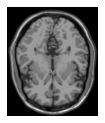

In [8]:
## Example of T1 Image

plt.figure(figsize=(2, 2))
plt.imshow(t1_images[0], cmap='gray')
plt.axis('off')
plt.show()

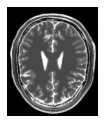

In [9]:
## Example of T2 Image

plt.figure(figsize=(2, 2))
plt.imshow(t2_images[0], cmap='gray')
plt.axis('off')
plt.show()

## Data Preprocessing

1. Data Normalisation
2. Resizing
3. Reshaping
4. Shuffling and Batching

### 1. Data normalisation

In [10]:
t1_images = (t1_images/127.5)-1.0 # Normalize the images to [-1.0, 1.0]
t1_images.shape

(43, 217, 181)

In [11]:
t2_images = (t2_images/127.5)-1.0 # Normalize the images to [-1.0, 1.0]
t2_images.shape

(46, 217, 181)

### 2. Resizing the data to shape 216x176

In [12]:
## resizing T1 images

t1_images_data = np.zeros((t1_images.shape[0], 216, 176))
for index, img in enumerate(t1_images):
    t1_images_data[index, :, :] = resize(img, (216, 176))
t1_images_data.shape

(43, 216, 176)

In [13]:
## resizing T2 images

t2_images_data = np.zeros((t2_images.shape[0], 216, 176))
for index, img in enumerate(t2_images):
    t2_images_data[index, :, :] = resize(img, (216, 176))
t2_images_data.shape

(46, 216, 176)

### 3. Reshaping the data to feed into the architecture

In [14]:
## reshaping to 216*176*1

t1_images_data = t1_images_data.reshape(t1_images_data.shape[0], 216, 176, 1).astype('float32')
t2_images_data = t2_images_data.reshape(t2_images_data.shape[0], 216, 176, 1).astype('float32')

### 4. Shuffling and Batching the data

In [15]:
t1_images_data = tf.data.Dataset.from_tensor_slices(t1_images_data).shuffle(t1_images.shape[0], seed=1).batch(BATCH_SIZE)
t2_images_data = tf.data.Dataset.from_tensor_slices(t2_images_data).shuffle(t2_images.shape[0], seed=1).batch(BATCH_SIZE)

#### Data Visualisation after preprocessing

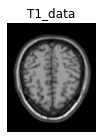

In [16]:
## T1 sample visualisation

sample_t1_images_data = next(iter(t1_images_data))
plt.figure(figsize=(2, 2))
plt.imshow(sample_t1_images_data[0].numpy()[:, :, 0], cmap='gray')
plt.title('T1_data')
plt.axis('off')
plt.show()

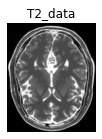

In [17]:
## T2 sample visualisation

sample_t2_images_data = next(iter(t2_images_data))
plt.figure(figsize=(2, 2))
plt.imshow(sample_t2_images_data[0].numpy()[:, :, 0], cmap='gray')
plt.title('T2_data')
plt.axis('off')
plt.show()

## Model Building

1. Instance Normalization
2. Downsampling, Upsampling and Unet
3. Generator Building using Unet
4. Discriminator Building

### 1. Instance Normalization 

Instance Normalization are specially used with Style Transfer, where Separate Normalization is performed for each sample we perform channelwise Normalization.

In [18]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

### 2.1 Downsampling

Downsampling is performed using the Convolution, leading to reduce in dimensions.

In [19]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

### 2.2 Upsampling 
Upsampling is a result of Transposed Convolution, where dimension of image are increased.

In [20]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

### 2.3 Unets
Unets takes Image as an input and translate it into another Image.

To do this they first use Downsampling on Input Image to learn the latent characteristics of Input Image and then use Upsampling to use this knowledge to Translate it into another Image.


In [27]:
# Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(64, 4,False), # (bs, 108, 88, 64)
        downsample(128, 4 ,False), # (bs, 54, 44, 128)
        downsample(256, 4), # (bs, 27, 22, 256)
    ]
    up_stack = [
        upsample(128, 4, True), # (bs, 54, 44, 128)
        upsample(64, 4, True), # (bs, 108, 88, 64)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 216, 176, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[216, 176, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

### 3. Generator
Generator is a Unet Network here since We want to translate One type of Image (T1) into Another type of Image (T2).

In [31]:
## initializing the generators

generator_g = unet_generator()
generator_f = unet_generator()

Let's also visualize one of our Generator Models since Both our Generators have same architecture.

Notice How the dimension reduces first but then increases.

In [32]:
## summary of geenrator g
generator_g.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 216, 176, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential_41 (Sequential)     (None, 108, 88, 64)  1024        ['input_8[0][0]']                
                                                                                                  
 sequential_42 (Sequential)     (None, 54, 44, 128)  131072      ['sequential_41[0][0]']          
                                                                                                  
 sequential_43 (Sequential)     (None, 27, 22, 256)  524800      ['sequential_42[0][0]']    

In [33]:
## summary of generator f
generator_f.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 216, 176, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential_46 (Sequential)     (None, 108, 88, 64)  1024        ['input_9[0][0]']                
                                                                                                  
 sequential_47 (Sequential)     (None, 54, 44, 128)  131072      ['sequential_46[0][0]']          
                                                                                                  
 sequential_48 (Sequential)     (None, 27, 22, 256)  524800      ['sequential_47[0][0]']    

### 4. Discriminator
Discriminator is a traditional CNN, which we use to classify the Images. It only uses Downsampling hence.

Both Discriminators have same architecture

In [40]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is not used 
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (216, 176, 1)
    inp = tf.keras.layers.Input(shape=[216 ,176, 1], name='input_image')
    x = inp
    
    # add downsampling step here
    down1 = downsample(64, 4, False)(x) # (bs, 108, 88, 64)
    down2 = downsample(128, 4)(down1) # (bs, 54, 44, 128)
    down3 = downsample(256, 4)(down2) # (bs, 27, 22, 256)
 
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 29, 24, 256)
    
    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 26, 21, 512)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    
    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 28, 23, 512)
    
    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 25, 20, 1)
    return tf.keras.Model(inputs=inp, outputs=last)

In [41]:
## initialisation of the discriminator

discriminator_x = discriminator()
discriminator_y = discriminator()

Have a look at Discriminator's architecture, Notice that The Dimensions are reducing overall at the end since it's a classifier and only Convolution layers are being used.

In [42]:
discriminator_x.summary()

Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 216, 176, 1)]     0         
                                                                 
 sequential_63 (Sequential)  (None, 108, 88, 64)       1024      
                                                                 
 sequential_64 (Sequential)  (None, 54, 44, 128)       131328    
                                                                 
 sequential_65 (Sequential)  (None, 27, 22, 256)       524800    
                                                                 
 zero_padding2d_8 (ZeroPaddi  (None, 29, 24, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_53 (Conv2D)          (None, 26, 21, 512)       2097152   
                                                          

## Model Training

1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

### Output of Untrained Generator models which should be a random noise

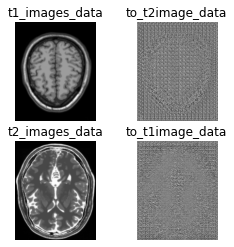

In [43]:
to_t2image_data = generator_g(sample_t1_images_data)
to_t1image_data = generator_f(sample_t2_images_data)
plt.figure(figsize=(4, 4))

imgs = [sample_t1_images_data, to_t2image_data, sample_t2_images_data, to_t1image_data]
title = ['t1_images_data', 'to_t2image_data', 't2_images_data', 'to_t1image_data']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

#### 1. Declare Loss as Binary Cross Entropy

Since Our Discriminator is a classifier

In [44]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### 2. Discriminator Loss
It consists of two types of losses

1. Loss on Real Data
2. Loss on Fake Data

In [45]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

#### 3. Generator Loss
It has only one type of loss - Discriminator Loss on Generated data

In [46]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

#### 4. Cycle Loss
When we use both of Generators sequentially on a Input Image, we get Cycle Image and the L1 Loss between these two is called Cycle Loss.

In [47]:
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

#### 5. Identity Loss
When we provide input image to the Generator such that no translation is needed because the Image is already transformed. Here also we take L1 Loss between Input and Output Image.

In [48]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

#### 6. Identity Loss
When we provide input image to the Generator such that no translation is needed because the Image is already transformed. Here also we take L1 Loss between Input and Output Image.

In [49]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [50]:
## Running for 250 epochs

EPOCHS = 250

#### 7. Checkpoint Initialization¶
Initialize checkpoints to save models

In [51]:
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

#### Function to show Images output by Generators while Training

In [52]:
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Predicted Image', 'Input Image', 'Predicted Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

#### 8. Training Flow
Below Function performs one Flow of Batch Training

Notice that Identity Loss and Cycle Loss are only used in training Generator and not Discriminator

Sequence of Training Flow

1. Generate Fake Y and Cycled X
2. Generate Fake X and Cycled Y
3. Generate Fake Images through G and F for Identity Loss.
4. Calculate Discriminator Loss for Disc X and Disc Y on Fake Data for Generator Training.
5. Calculate Generator Loss on Discriminator.
6. Calculate Cycled Loss on Cycled Images from step 1 and 2.
7. Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8. Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9. Calculate the Gradients and update the weight and bias of models.

In [53]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        
        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

#### Train the CycleGAN Model for several Epochs¶
Loop training function for number of epochs and also show the output at each step.

Note how Generators are getting better at producing realistic images epoch by epoch

In [54]:
EPOCHS

75

In [ ]:
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((t1_images_data, t2_images_data)):
        train_step(image_x, image_y)
    generate_images(generator_g, sample_t1_images_data, generator_f, sample_t2_images_data)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

## Generating a GIF for visualization of Results

Notice the Quality of results we are getting.

In [57]:
anim_file = 'cyclegan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('image*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

In [58]:
#!pip install git+https://github.com/tensorflow/docs


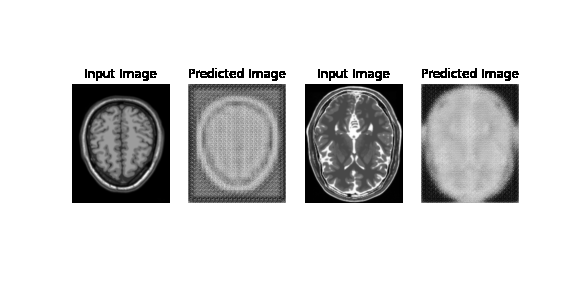

In [59]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

## Results

### As we can see from the GIF transformation of 250 different images, it turns from a poor image to a very accurate copy of the T1 image. Similarly for T2 to T1 transformation.
### This can be very helpful in the MRI Processing landscape as it can help to save money & time of patients and hospitals to find different MRIs inorder to search for any issues.